In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [1]:
!pip install -q transformers
!pip install -q datasets
!pip install -q accelerate
!pip install -q evaluate
!pip install -q lime
!pip install -q transformers-interpret
!pip install -q nltk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.9/45.9 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.2/455.2 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 72.4 MB/s eta 0:00:00


In [2]:
import re
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    TrainingArguments
)

import nltk
from nltk.corpus import wordnet

nltk.download("wordnet")
nltk.download("omw-1.4")

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [3]:
import torch

print(torch.cuda.is_available())

print(torch.cuda.get_device_name(0))

True
Tesla T4


In [4]:
df = pd.read_csv("phishing_dataset.csv")

df.head()

,text,label,source
0,(00-380) Trading prohibition and registration ...,0,Enron
1,RE: Phone Call You need to give me a boottle i...,0,Enron
2,Desk Password Update Click Here To keep your e...,1,Nazario_5
3,Account jose@monkey.org Email Quata Limit Mail...,1,Nazario_5
4,Re: Fort James/Wauna contract termination Ther...,0,Enron


In [5]:
df = df.rename(columns={
    "Email Text":"text",
    "Email Type":"label"
})

In [6]:
df["label"] = df["label"].map({
    "Safe Email":0,
    "Phishing Email":1
})

In [7]:
df.head()

,text,label,source
0,(00-380) Trading prohibition and registration ...,NaN,Enron
1,RE: Phone Call You need to give me a boottle i...,NaN,Enron
2,Desk Password Update Click Here To keep your e...,NaN,Nazario_5
3,Account jose@monkey.org Email Quata Limit Mail...,NaN,Nazario_5
4,Re: Fort James/Wauna contract termination Ther...,NaN,Enron


In [8]:
print(df["source"].unique())

['Enron' 'Nazario_5']


In [9]:
print(df["source"].value_counts())

source
Enron        1552
Nazario_5    1552
Name: count, dtype: int64


In [10]:
df["label"] = df["source"].map({
    "Enron": 0,
    "Nazario_5": 1
})

In [11]:
print(df["label"].value_counts())

label
0    1552
1    1552
Name: count, dtype: int64


In [12]:
print(df["label"].isnull().sum())

0


In [13]:
df = df.dropna()

df["text"] = df["text"].astype(str)

df["text"] = df["text"].str.replace("\n"," ")

df["text"] = df["text"].str.replace("\r"," ")

df["text"] = df["text"].str.lower()

In [14]:
print(df.shape)

print(df["label"].value_counts())

(3104, 3)
label
0    1552
1    1552
Name: count, dtype: int64


In [15]:
train_val_df, test_df = train_test_split(
    df,
    test_size=0.20,
    random_state=42,
    stratify=df["label"]
)

In [16]:
train_df, val_df = train_test_split(
    train_val_df,
    test_size=0.20,
    random_state=42,
    stratify=train_val_df["label"]
)

In [17]:
from transformers import AutoTokenizer

In [18]:
bert_tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [19]:
roberta_tokenizer = AutoTokenizer.from_pretrained("roberta-base")

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [20]:
bert_train_encodings = bert_tokenizer(
    train_df["text"].tolist(),
    truncation=True,
    padding=True,
    max_length=256
)

In [21]:
bert_test_encodings = bert_tokenizer(
    test_df["text"].tolist(),
    truncation=True,
    padding=True,
    max_length=256
)

In [22]:
print(bert_train_encodings.keys())

KeysView({'input_ids': [[101, 2128, 1024, 7016, 6202, 6409, 2919, 3291, 1010, 2204, 3433, 1012, 2024, 2045, 2151, 2500, 2073, 3976, 2347, 1005, 1056, 2108, 7172, 1029, 6174, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 6187, 4425, 22213, 2182, 2024, 1996, 8866, 2000, 2022, 4991, 2046, 3331, 2685, 1013, 8866, 7123, 2005, 6187, 2136, 1012, 428

In [23]:
print(bert_train_encodings["input_ids"][0][:20])

[101, 2128, 1024, 7016, 6202, 6409, 2919, 3291, 1010, 2204, 3433, 1012, 2024, 2045, 2151, 2500, 2073, 3976, 2347, 1005]


In [24]:
print(len(bert_train_encodings["input_ids"][0]))

256


In [25]:
print(bert_train_encodings.keys())
print(len(bert_train_encodings["input_ids"][0]))

KeysView({'input_ids': [[101, 2128, 1024, 7016, 6202, 6409, 2919, 3291, 1010, 2204, 3433, 1012, 2024, 2045, 2151, 2500, 2073, 3976, 2347, 1005, 1056, 2108, 7172, 1029, 6174, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 6187, 4425, 22213, 2182, 2024, 1996, 8866, 2000, 2022, 4991, 2046, 3331, 2685, 1013, 8866, 7123, 2005, 6187, 2136, 1012, 428

In [26]:
import torch

class EmailDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = list(labels)

    def __getitem__(self, idx):
        item = {
            key: torch.tensor(value[idx])
            for key, value in self.encodings.items()
        }

        item["labels"] = torch.tensor(
            self.labels[idx],
            dtype=torch.long
        )

        return item

    def __len__(self):
        return len(self.labels)

In [27]:
bert_train_dataset = EmailDataset(
    bert_train_encodings,
    train_df["label"]
)

In [28]:
bert_test_dataset = EmailDataset(
    bert_test_encodings,
    test_df["label"]
)

In [29]:
print("Training samples:", len(bert_train_dataset))
print("Testing samples:", len(bert_test_dataset))

Training samples: 1986
Testing samples: 621


In [30]:
sample = bert_train_dataset[0]

print(sample.keys())

dict_keys(['input_ids', 'token_type_ids', 'attention_mask', 'labels'])


In [31]:
print("Input IDs shape:", sample["input_ids"].shape)
print("Attention mask shape:", sample["attention_mask"].shape)
print("Label:", sample["labels"])

Input IDs shape: torch.Size([256])
Attention mask shape: torch.Size([256])
Label: tensor(0)


In [32]:
print("0 = Legitimate")
print("1 = Phishing")
print("First sample label:", sample["labels"].item())

0 = Legitimate
1 = Phishing
First sample label: 0


In [33]:
roberta_train_dataset = EmailDataset(
    roberta_train_encodings,
    train_df["label"]
)

roberta_test_dataset = EmailDataset(
    roberta_test_encodings,
    test_df["label"]
)

NameError: name 'roberta_train_encodings' is not defined

In [34]:
import torch

class EmailDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = list(labels)

    def __getitem__(self, idx):
        item = {
            key: torch.tensor(value[idx])
            for key, value in self.encodings.items()
        }

        item["labels"] = torch.tensor(
            self.labels[idx],
            dtype=torch.long
        )

        return item

    def __len__(self):
        return len(self.labels)

In [35]:
balanced_train_df
val_df
test_df
train_dataset
val_dataset
test_dataset
tokenizer
compute_metrics

NameError: name 'balanced_train_df' is not defined

In [36]:
train_df
val_df
test_df
train_dataset
val_dataset
test_dataset
tokenizer
compute_metrics

NameError: name 'train_dataset' is not defined

In [37]:
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained("roberta-base")

In [38]:
train_encodings = tokenizer(
    train_df["text"].tolist(),
    truncation=True,
    padding=True,
    max_length=512
)

val_encodings = tokenizer(
    val_df["text"import torch

class EmailDataset(torch.utils.data.Dataset):

    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = list(labels)

    def __getitem__(self, idx):

        item = {
            key: torch.tensor(val[idx])
            for key, val in self.encodings.items()
        }

        item["labels"] = torch.tensor(self.labels[idx])

        return item

    def __len__(self):
        return len(self.labels)].tolist(),
    truncation=True,
    padding=True,
    max_length=512
)

test_encodings = tokenizer(
    test_df["text"].tolist(),
    truncation=True,
    padding=True,
    max_length=512
)

In [39]:
import torch

class EmailDataset(torch.utils.data.Dataset):

    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = list(labels)

    def __getitem__(self, idx):

        item = {
            key: torch.tensor(val[idx])
            for key, val in self.encodings.items()
        }

        item["labels"] = torch.tensor(self.labels[idx])

        return item

    def __len__(self):
        return len(self.labels)

In [40]:
train_dataset = EmailDataset(
    train_encodings,
    train_df["label"]
)

val_dataset = EmailDataset(
    val_encodings,
    val_df["label"]
)

test_dataset = EmailDataset(
    test_encodings,
    test_df["label"]
)

In [41]:
print(len(train_dataset))
print(len(val_dataset))
print(len(test_dataset))

1986
497
621


In [42]:
roberta_model = AutoModelForSequenceClassification.from_pretrained(
    "roberta-base",
    num_labels=2
)

model.safetensors: reconstructing file:   0%|          |  0.00B /  499MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] RobertaForSequenceClassification LOAD REPORT from: roberta-base
Key                        | Status     | 
---------------------------+------------+-
lm_head.dense.weight       | UNEXPECTED | 
lm_head.layer_norm.bias    | UNEXPECTED | 
lm_head.layer_norm.weight  | UNEXPECTED | 
lm_head.bias               | UNEXPECTED | 
lm_head.dense.bias         | UNEXPECTED | 
classifier.dense.bias      | MISSING    | 
classifier.out_proj.weight | MISSING    | 
classifier.dense.weight    | MISSING    | 
classifier.out_proj.bias   | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


In [43]:
roberta_model = AutoModelForSequenceClassification.from_pretrained(
    "roberta-base",
    num_labels=2
)

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] RobertaForSequenceClassification LOAD REPORT from: roberta-base
Key                        | Status     | 
---------------------------+------------+-
lm_head.dense.weight       | UNEXPECTED | 
lm_head.layer_norm.bias    | UNEXPECTED | 
lm_head.layer_norm.weight  | UNEXPECTED | 
lm_head.bias               | UNEXPECTED | 
lm_head.dense.bias         | UNEXPECTED | 
classifier.dense.bias      | MISSING    | 
classifier.out_proj.weight | MISSING    | 
classifier.dense.weight    | MISSING    | 
classifier.out_proj.bias   | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


In [44]:
roberta_trainer.train()

NameError: name 'roberta_trainer' is not defined

In [45]:
balanced_train_df
val_df
test_df
train_dataset
val_dataset
test_dataset
tokenizer
compute_metrics

NameError: name 'balanced_train_df' is not defined

In [46]:
print("train_df exists:", "train_df" in globals())
print("val_df exists:", "val_df" in globals())
print("test_df exists:", "test_df" in globals())
print("train_dataset exists:", "train_dataset" in globals())
print("tokenizer exists:", "tokenizer" in globals())

train_df exists: True
val_df exists: True
test_df exists: True
train_dataset exists: True
tokenizer exists: True


In [47]:
balanced_train_df["label"].value_counts()

NameError: name 'balanced_train_df' is not defined

In [48]:
train_df["label"].value_counts()

,count
label,
0,993
1,993


In [49]:
print(train_df.head())
print(val_df.head())
print(test_df.head())

                                                   text  label     source
262   re: debt trading losses bad problem, good resp...      0      Enron
136   ca supply realities here are the facts to be c...      0      Enron
1504  call w/ teco tomorrow at 10:30 central for cal...      0      Enron
2445  re: midland please put this on my calender shi...      0      Enron
1539  your mailbox size notification your email acco...      1  Nazario_5
                                                   text  label     source
1305  your citi bank account has been temporarily su...      1  Nazario_5
1760  re: first delivery - wagner oil vance, deal # ...      0      Enron
2192  verification dear zimbra user, this is to info...      1  Nazario_5
1402  we're having some trouble with your current bi...      1  Nazario_5
1362  meeting w/ elizabeth sager re: retail power tr...      0      Enron
                                                   text  label     source
2815  i just sent you a file via dropb

In [50]:
print(globals().keys())

dict_keys(['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__builtin__', '__builtins__', '_ih', '_oh', '_dh', 'In', 'Out', 'get_ipython', 'exit', 'quit', '_', '__', '___', '_i', '_ii', '_iii', '_i1', '_exit_code', '_i2', 're', 'random', 'np', 'pd', 'plt', 'torch', 'train_test_split', 'accuracy_score', 'precision_score', 'recall_score', 'f1_score', 'classification_report', 'confusion_matrix', 'AutoTokenizer', 'AutoModelForSequenceClassification', 'Trainer', 'TrainingArguments', 'nltk', 'wordnet', '_2', '_i3', '_i4', 'df', '_4', '_i5', '_i6', '_i7', '_7', '_i8', '_i9', '_i10', '_i11', '_i12', '_i13', '_i14', '_i15', 'train_val_df', 'test_df', '_i16', 'train_df', 'val_df', '_i17', '_i18', 'bert_tokenizer', '_i19', 'roberta_tokenizer', '_i20', 'bert_train_encodings', '_i21', 'bert_test_encodings', '_i22', '_i23', '_i24', '_i25', '_i26', 'EmailDataset', '_i27', 'bert_train_dataset', '_i28', 'bert_test_dataset', '_i29', '_i30', 'sample', '_i31', '_i32', '_i33', '_i34', '_i35

In [51]:
print(globals().keys())

dict_keys(['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__builtin__', '__builtins__', '_ih', '_oh', '_dh', 'In', 'Out', 'get_ipython', 'exit', 'quit', '_', '__', '___', '_i', '_ii', '_iii', '_i1', '_exit_code', '_i2', 're', 'random', 'np', 'pd', 'plt', 'torch', 'train_test_split', 'accuracy_score', 'precision_score', 'recall_score', 'f1_score', 'classification_report', 'confusion_matrix', 'AutoTokenizer', 'AutoModelForSequenceClassification', 'Trainer', 'TrainingArguments', 'nltk', 'wordnet', '_2', '_i3', '_i4', 'df', '_4', '_i5', '_i6', '_i7', '_7', '_i8', '_i9', '_i10', '_i11', '_i12', '_i13', '_i14', '_i15', 'train_val_df', 'test_df', '_i16', 'train_df', 'val_df', '_i17', '_i18', 'bert_tokenizer', '_i19', 'roberta_tokenizer', '_i20', 'bert_train_encodings', '_i21', 'bert_test_encodings', '_i22', '_i23', '_i24', '_i25', '_i26', 'EmailDataset', '_i27', 'bert_train_dataset', '_i28', 'bert_test_dataset', '_i29', '_i30', 'sample', '_i31', '_i32', '_i33', '_i34', '_i35

In [52]:
print(globals().keys())

dict_keys(['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__builtin__', '__builtins__', '_ih', '_oh', '_dh', 'In', 'Out', 'get_ipython', 'exit', 'quit', '_', '__', '___', '_i', '_ii', '_iii', '_i1', '_exit_code', '_i2', 're', 'random', 'np', 'pd', 'plt', 'torch', 'train_test_split', 'accuracy_score', 'precision_score', 'recall_score', 'f1_score', 'classification_report', 'confusion_matrix', 'AutoTokenizer', 'AutoModelForSequenceClassification', 'Trainer', 'TrainingArguments', 'nltk', 'wordnet', '_2', '_i3', '_i4', 'df', '_4', '_i5', '_i6', '_i7', '_7', '_i8', '_i9', '_i10', '_i11', '_i12', '_i13', '_i14', '_i15', 'train_val_df', 'test_df', '_i16', 'train_df', 'val_df', '_i17', '_i18', 'bert_tokenizer', '_i19', 'roberta_tokenizer', '_i20', 'bert_train_encodings', '_i21', 'bert_test_encodings', '_i22', '_i23', '_i24', '_i25', '_i26', 'EmailDataset', '_i27', 'bert_train_dataset', '_i28', 'bert_test_dataset', '_i29', '_i30', 'sample', '_i31', '_i32', '_i33', '_i34', '_i35

In [53]:
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained("roberta-base")

In [54]:
train_encodings = tokenizer(
    train_df["text"].tolist(),
    truncation=True,
    padding="max_length",
    max_length=256
)

val_encodings = tokenizer(
    val_df["text"].tolist(),
    truncation=True,
    padding="max_length",
    max_length=256
)

test_encodings = tokenizer(
    test_df["text"].tolist(),
    truncation=True,
    padding="max_length",
    max_length=256
)

In [55]:
import torch

class EmailDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels.tolist()

    def __getitem__(self, idx):
        item = {
            key: torch.tensor(values[idx])
            for key, values in self.encodings.items()
        }

        item["labels"] = torch.tensor(
            self.labels[idx],
            dtype=torch.long
        )

        return item

    def __len__(self):
        return len(self.labels)

In [56]:
train_dataset = EmailDataset(
    train_encodings,
    train_df["label"]
)

val_dataset = EmailDataset(
    val_encodings,
    val_df["label"]
)

test_dataset = EmailDataset(
    test_encodings,
    test_df["label"]
)

In [57]:
print("Training samples:", len(train_dataset))
print("Validation samples:", len(val_dataset))
print("Testing samples:", len(test_dataset))
print(train_dataset[0].keys())

Training samples: 1986
Validation samples: 497
Testing samples: 621
dict_keys(['input_ids', 'attention_mask', 'labels'])


In [58]:
import numpy as np

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)

    return {
        "accuracy": accuracy_score(labels, predictions),
        "precision": precision_score(
            labels,
            predictions,
            zero_division=0
        ),
        "recall": recall_score(
            labels,
            predictions,
            zero_division=0
        ),
        "f1": f1_score(
            labels,
            predictions,
            zero_division=0
        )
    }

In [59]:
print("Tokenizer ready:", tokenizer is not None)
print("Train dataset:", len(train_dataset))
print("Validation dataset:", len(val_dataset))
print("Test dataset:", len(test_dataset))
print("Metrics function ready:", callable(compute_metrics))

Tokenizer ready: True
Train dataset: 1986
Validation dataset: 497
Test dataset: 621
Metrics function ready: True


In [60]:
from transformers import AutoModelForSequenceClassification

roberta_model = AutoModelForSequenceClassification.from_pretrained(
    "roberta-base",
    num_labels=2,
    id2label={
        0: "Legitimate Email",
        1: "Phishing Email"
    },
    label2id={
        "Legitimate Email": 0,
        "Phishing Email": 1
    }
)

Loading weights:   0%|          | 0/197 [00:00<?, ?it/s]

[transformers] RobertaForSequenceClassification LOAD REPORT from: roberta-base
Key                        | Status     | 
---------------------------+------------+-
lm_head.dense.weight       | UNEXPECTED | 
lm_head.layer_norm.bias    | UNEXPECTED | 
lm_head.layer_norm.weight  | UNEXPECTED | 
lm_head.bias               | UNEXPECTED | 
lm_head.dense.bias         | UNEXPECTED | 
classifier.dense.bias      | MISSING    | 
classifier.out_proj.weight | MISSING    | 
classifier.dense.weight    | MISSING    | 
classifier.out_proj.bias   | MISSING    | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING:	those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


In [61]:
import torch

print("GPU available:", torch.cuda.is_available())
print(
    torch.cuda.get_device_name(0)
    if torch.cuda.is_available()
    else "CPU"
)

GPU available: True
Tesla T4


In [62]:
from transformers import TrainingArguments

training_args = TrainingArguments(
    output_dir="./paper2_roberta_results",

    learning_rate=2e-5,

    per_device_train_batch_size=8,
    gradient_accumulation_steps=4,

    per_device_eval_batch_size=16,

    num_train_epochs=5,
    weight_decay=0.01,

    eval_strategy="epoch",
    save_strategy="epoch",

    load_best_model_at_end=True,
    metric_for_best_model="f1",
    greater_is_better=True,

    logging_steps=50,
    save_total_limit=2,

    fp16=True,
    report_to="none",
    seed=42
)

In [63]:
from transformers import Trainer

roberta_trainer = Trainer(
    model=roberta_model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics
)

In [64]:
print("Trainer device:", roberta_trainer.args.device)

Trainer device: cuda:0


In [65]:
train_result = roberta_trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,1.125261,0.065711,0.981891,0.980000,0.983936,0.981964
2,0.262329,0.029762,0.987928,0.991903,0.983936,0.987903
3,0.264928,0.029668,0.993964,0.988095,1.000000,0.994012
4,0.018594,0.016250,0.995976,0.992032,1.000000,0.996000
5,0.014596,0.017699,0.995976,0.992032,1.000000,0.996000


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

In [66]:
validation_results = roberta_trainer.evaluate(
    eval_dataset=val_dataset
)

validation_results

Training Loss,Validation Loss,Epoch,Accuracy,Precision,Recall,F1
0.014596,0.016250,5,0.995976,0.992032,1.000000,0.996000


{'eval_loss': 0.01625041477382183,
 'eval_accuracy': 0.9959758551307847,
 'eval_precision': 0.9920318725099602,
 'eval_recall': 1.0,
 'eval_f1': 0.996}

In [67]:
roberta_trainer.save_model("./paper2_best_roberta")
tokenizer.save_pretrained("./paper2_best_roberta")

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

('./paper2_best_roberta/tokenizer_config.json',
 './paper2_best_roberta/tokenizer.json')

In [68]:
test_results = roberta_trainer.evaluate(
    eval_dataset=test_dataset
)

test_results

Training Loss,Validation Loss,Epoch,Accuracy,Precision,Recall,F1
0.014596,0.043427,5,0.993559,0.993548,0.993548,0.993548


{'eval_loss': 0.04342691972851753,
 'eval_accuracy': 0.9935587761674718,
 'eval_precision': 0.9935483870967742,
 'eval_recall': 0.9935483870967742,
 'eval_f1': 0.9935483870967742}

In [69]:
import numpy as np

prediction_output = roberta_trainer.predict(
    test_dataset
)

y_pred = np.argmax(
    prediction_output.predictions,
    axis=1
)

y_true = test_df["label"].to_numpy()

In [70]:
from sklearn.metrics import classification_report

print(
    classification_report(
        y_true,
        y_pred,
        target_names=[
            "Legitimate Email",
            "Phishing Email"
        ],
        digits=4
    )
)

                  precision    recall  f1-score   support

Legitimate Email     0.9936    0.9936    0.9936       311
  Phishing Email     0.9935    0.9935    0.9935       310

        accuracy                         0.9936       621
       macro avg     0.9936    0.9936    0.9936       621
    weighted avg     0.9936    0.9936    0.9936       621



In [71]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(
    y_true,
    y_pred
)

print(cm)

[[309   2]
 [  2 308]]


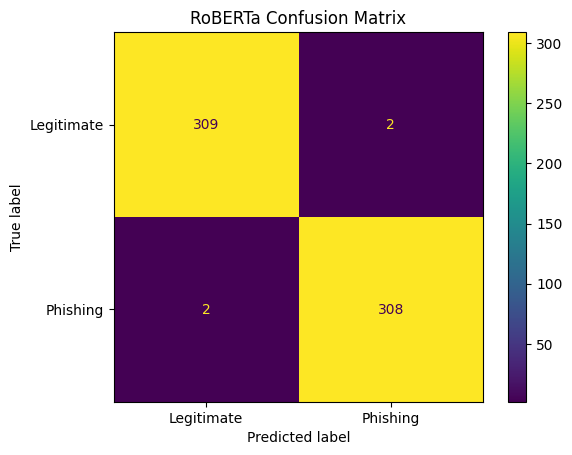

In [72]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=[
        "Legitimate",
        "Phishing"
    ]
).plot(
    values_format="d"
)

plt.title("RoBERTa Confusion Matrix")
plt.show()

In [73]:
import pandas as pd

results_df = pd.DataFrame([
    {
        "Model": "RoBERTa",
        "Accuracy": test_results["eval_accuracy"],
        "Precision": test_results["eval_precision"],
        "Recall": test_results["eval_recall"],
        "F1-score": test_results["eval_f1"],
        "Loss": test_results["eval_loss"]
    }
])

results_df

,Model,Accuracy,Precision,Recall,F1-score,Loss
0,RoBERTa,0.993559,0.993548,0.993548,0.993548,0.043427


In [74]:
results_df.to_csv(
    "paper2_roberta_test_results.csv",
    index=False
)

In [75]:
prediction_df = test_df.copy()

prediction_df["predicted_label"] = y_pred

prediction_df["predicted_class"] = prediction_df[
    "predicted_label"
].map({
    0: "Legitimate Email",
    1: "Phishing Email"
})

prediction_df.to_csv(
    "paper2_test_predictions.csv",
    index=False
)

In [76]:
roberta_model
roberta_trainer
tokenizer
test_df
test_dataset

In [77]:
!pip install -q lime

In [78]:
import torch
import numpy as np

from lime.lime_text import LimeTextExplainer

In [79]:
device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

roberta_model.to(device)
roberta_model.eval()

print("Model device:", next(roberta_model.parameters()).device)

Model device: cuda:0


In [80]:
def predict_probabilities(texts):
    encoded = tokenizer(
        list(texts),
        truncation=True,
        padding=True,
        max_length=256,
        return_tensors="pt"
    )

    encoded = {
        key: value.to(device)
        for key, value in encoded.items()
    }

    with torch.no_grad():
        outputs = roberta_model(**encoded)
        probabilities = torch.softmax(
            outputs.logits,
            dim=1
        )

    return probabilities.cpu().numpy()

In [81]:
phishing_examples = test_df[
    test_df["label"] == 1
].reset_index(drop=True)

sample_text = phishing_examples.iloc[0]["text"]

print(sample_text)

i just sent you a file via dropbox... hello jose@monkey.org, i just used dropbox to send you the invoice document! click to view document happy dropboxing! hello jose@monkey.org,i just used dropbox to send you the invoice document!click to view documenthappy dropboxing!


In [82]:
probabilities = predict_probabilities([sample_text])

print("Legitimate probability:", probabilities[0][0])
print("Phishing probability:", probabilities[0][1])

Legitimate probability: 7.782753e-05
Phishing probability: 0.99992216


In [83]:
lime_explainer = LimeTextExplainer(
    class_names=[
        "Legitimate Email",
        "Phishing Email"
    ],
    random_state=42
)

In [84]:
lime_explanation = lime_explainer.explain_instance(
    sample_text,
    predict_probabilities,
    labels=[1],
    num_features=15,
    num_samples=1000
)

In [85]:
lime_explanation.show_in_notebook(
    text=True
)

In [86]:
lime_scores = lime_explanation.as_list(
    label=1
)

lime_scores

[(np.str_('jose'), 0.003143933948276025),
 (np.str_('org'), 0.0029329109748550486),
 (np.str_('send'), 0.002567958676249478),
 (np.str_('dropbox'), 0.0025475794025952964),
 (np.str_('monkey'), 0.0024000579049698262),
 (np.str_('view'), 0.0023994027159572225),
 (np.str_('click'), 0.00232115617126405),
 (np.str_('document'), 0.0021721862698757767),
 (np.str_('invoice'), 0.002069739951826621),
 (np.str_('a'), -0.001986351750315378),
 (np.str_('hello'), 0.0018891825992014722),
 (np.str_('file'), 0.0017979384526147317),
 (np.str_('just'), -0.0016174169506626664),
 (np.str_('documenthappy'), 0.0014457231486974215),
 (np.str_('via'), -0.0012825142262333194)]

In [87]:
lime_scores = lime_explanation.as_list(
    label=1
)

lime_scores

[(np.str_('jose'), 0.003143933948276025),
 (np.str_('org'), 0.0029329109748550486),
 (np.str_('send'), 0.002567958676249478),
 (np.str_('dropbox'), 0.0025475794025952964),
 (np.str_('monkey'), 0.0024000579049698262),
 (np.str_('view'), 0.0023994027159572225),
 (np.str_('click'), 0.00232115617126405),
 (np.str_('document'), 0.0021721862698757767),
 (np.str_('invoice'), 0.002069739951826621),
 (np.str_('a'), -0.001986351750315378),
 (np.str_('hello'), 0.0018891825992014722),
 (np.str_('file'), 0.0017979384526147317),
 (np.str_('just'), -0.0016174169506626664),
 (np.str_('documenthappy'), 0.0014457231486974215),
 (np.str_('via'), -0.0012825142262333194)]

In [88]:
import pandas as pd

lime_results_df = pd.DataFrame(
    lime_scores,
    columns=[
        "Word",
        "LIME contribution score"
    ]
)

lime_results_df.to_csv(
    "paper2_lime_explanation.csv",
    index=False
)

lime_results_df

,Word,LIME contribution score
0,jose,0.003144
1,org,0.002933
2,send,0.002568
3,dropbox,0.002548
4,monkey,0.002400
5,view,0.002399
6,click,0.002321
7,document,0.002172
8,invoice,0.002070
9,a,-0.001986


In [90]:
lime_explanation.save_to_file(
    "paper2_lime_explanation.html"
)

In [91]:
roberta_model
tokenizer
sample_text

'i just sent you a file via dropbox... hello jose@monkey.org, i just used dropbox to send you the invoice document! click to view document happy dropboxing! hello jose@monkey.org,i just used dropbox to send you the invoice document!click to view documenthappy dropboxing!'

In [92]:
!pip install -q transformers-interpret

In [93]:
from transformers_interpret import SequenceClassificationExplainer

In [94]:
roberta_model.eval()

RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (position_embeddings): Embedding(514, 768, padding_idx=1)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
             

In [95]:
transformer_explainer = SequenceClassificationExplainer(
    roberta_model,
    tokenizer
)

In [96]:
transformer_attributions = transformer_explainer(
    sample_text,
    class_name="Phishing Email"
)

In [97]:
transformer_attributions[:20]

[('<s>', 0.0),
 ('i', 0.09107497334480286),
 ('just', 0.17856192588806152),
 ('sent', -0.07366808503866196),
 ('you', 0.01097455807030201),
 ('a', -0.10313568264245987),
 ('file', 0.17456333339214325),
 ('via', 0.017863499000668526),
 ('drop', 0.12847158312797546),
 ('box', 0.26862043142318726),
 ('.', 0.14548644423484802),
 ('.', 0.19779567420482635),
 ('.', 0.16001595556735992),
 ('hello', 0.22306789457798004),
 ('j', 0.027148569002747536),
 ('ose', 0.1783541738986969),
 ('@', -0.03198733553290367),
 ('monkey', 0.16521063446998596),
 ('.', 0.017952395603060722),
 ('org', 0.23006725311279297)]

In [98]:
transformer_explainer.visualize(
    "paper2_transformer_explanation.html"
)

In [99]:
import pandas as pd

transformer_results_df = pd.DataFrame(
    transformer_attributions,
    columns=[
        "Token",
        "Transformer contribution score"
    ]
)

transformer_results_df

,Token,Transformer contribution score
0,<s>,0.000000
1,i,0.091075
2,just,0.178562
3,sent,-0.073668
4,you,0.010975
...,...,...
66,drop,0.066297
67,boxing,0.223264
68,!,0.138247
69,,0.286764


In [100]:
transformer_results_df.to_csv(
    "paper2_transformer_explanation.csv",
    index=False
)

In [101]:
transformer_scores = {}

for token, score in transformer_attributions:
    clean_token = (
        token
        .replace("Ġ", "")
        .replace("##", "")
        .replace("<s>", "")
        .replace("</s>", "")
        .strip()
        .lower()
    )

    if clean_token:
        transformer_scores[clean_token] = (
            transformer_scores.get(clean_token, 0.0)
            + float(score)
        )

transformer_scores

{'i': 0.45191314816474915,
 'just': 0.32543959841132164,
 'sent': -0.07366808503866196,
 'you': 0.1356066707521677,
 'a': -0.10313568264245987,
 'file': 0.17456333339214325,
 'via': 0.017863499000668526,
 'drop': 0.4741453267633915,
 'box': 0.43481310084462166,
 '.': 0.4881615284830332,
 'hello': 0.29808423668146133,
 'j': 0.05313479155302048,
 'ose': 0.24080059304833412,
 '@': -0.004427231848239899,
 'monkey': 0.16085435450077057,
 'org': 0.3066362291574478,
 ',': 0.24502790719270706,
 'used': 0.19987817108631134,
 'to': -0.08947833441197872,
 'send': -0.0799924349412322,
 'the': 0.15679504349827766,
 'invoice': 0.3103274703025818,
 'document': 0.49968918412923813,
 '!': 0.04038926772773266,
 'click': 0.05672417604364455,
 'view': 0.13421235606074333,
 'happy': 0.059428365901112556,
 'boxing': 0.381375715136528}

In [102]:
transformer_scores = {}

for token, score in transformer_attributions:
    clean_token = (
        token
        .replace("Ġ", "")
        .replace("##", "")
        .replace("<s>", "")
        .replace("</s>", "")
        .strip()
        .lower()
    )

    if clean_token:
        transformer_scores[clean_token] = (
            transformer_scores.get(clean_token, 0.0)
            + float(score)
        )

transformer_scores

{'i': 0.45191314816474915,
 'just': 0.32543959841132164,
 'sent': -0.07366808503866196,
 'you': 0.1356066707521677,
 'a': -0.10313568264245987,
 'file': 0.17456333339214325,
 'via': 0.017863499000668526,
 'drop': 0.4741453267633915,
 'box': 0.43481310084462166,
 '.': 0.4881615284830332,
 'hello': 0.29808423668146133,
 'j': 0.05313479155302048,
 'ose': 0.24080059304833412,
 '@': -0.004427231848239899,
 'monkey': 0.16085435450077057,
 'org': 0.3066362291574478,
 ',': 0.24502790719270706,
 'used': 0.19987817108631134,
 'to': -0.08947833441197872,
 'send': -0.0799924349412322,
 'the': 0.15679504349827766,
 'invoice': 0.3103274703025818,
 'document': 0.49968918412923813,
 '!': 0.04038926772773266,
 'click': 0.05672417604364455,
 'view': 0.13421235606074333,
 'happy': 0.059428365901112556,
 'boxing': 0.381375715136528}

In [103]:
lime_scores
transformer_scores

{'i': 0.45191314816474915,
 'just': 0.32543959841132164,
 'sent': -0.07366808503866196,
 'you': 0.1356066707521677,
 'a': -0.10313568264245987,
 'file': 0.17456333339214325,
 'via': 0.017863499000668526,
 'drop': 0.4741453267633915,
 'box': 0.43481310084462166,
 '.': 0.4881615284830332,
 'hello': 0.29808423668146133,
 'j': 0.05313479155302048,
 'ose': 0.24080059304833412,
 '@': -0.004427231848239899,
 'monkey': 0.16085435450077057,
 'org': 0.3066362291574478,
 ',': 0.24502790719270706,
 'used': 0.19987817108631134,
 'to': -0.08947833441197872,
 'send': -0.0799924349412322,
 'the': 0.15679504349827766,
 'invoice': 0.3103274703025818,
 'document': 0.49968918412923813,
 '!': 0.04038926772773266,
 'click': 0.05672417604364455,
 'view': 0.13421235606074333,
 'happy': 0.059428365901112556,
 'boxing': 0.381375715136528}

In [104]:
lime_score_dict = {
    word.lower().strip(): float(score)
    for word, score in lime_scores
}

lime_score_dict

{'jose': 0.003143933948276025,
 'org': 0.0029329109748550486,
 'send': 0.002567958676249478,
 'dropbox': 0.0025475794025952964,
 'monkey': 0.0024000579049698262,
 'view': 0.0023994027159572225,
 'click': 0.00232115617126405,
 'document': 0.0021721862698757767,
 'invoice': 0.002069739951826621,
 'a': -0.001986351750315378,
 'hello': 0.0018891825992014722,
 'file': 0.0017979384526147317,
 'just': -0.0016174169506626664,
 'documenthappy': 0.0014457231486974215,
 'via': -0.0012825142262333194}

In [105]:
import numpy as np

def minmax_normalise(score_dict):
    if not score_dict:
        return {}

    values = np.array(
        list(score_dict.values()),
        dtype=float
    )

    minimum = values.min()
    maximum = values.max()

    if maximum == minimum:
        return {
            key: 0.0
            for key in score_dict
        }

    return {
        key: (
            2 * ((value - minimum) /
                 (maximum - minimum))
            - 1
        )
        for key, value in score_dict.items()
    }

In [106]:
normalised_lime = minmax_normalise(
    lime_score_dict
)

normalised_transformer = minmax_normalise(
    transformer_scores
)

In [107]:
print("Normalised LIME:")
print(normalised_lime)

print("\nNormalised Transformer scores:")
print(normalised_transformer)

Normalised LIME:
{'jose': np.float64(1.0), 'org': np.float64(0.9177344164365282), 'send': np.float64(0.7754607420071398), 'dropbox': np.float64(0.7675160485333332), 'monkey': np.float64(0.7100059969329029), 'view': np.float64(0.7097505768447847), 'click': np.float64(0.6792468001390715), 'document': np.float64(0.6211721001553354), 'invoice': np.float64(0.581234239354607), 'a': np.float64(-1.0), 'hello': np.float64(0.5108454293611508), 'file': np.float64(0.47527464365937466), 'just': np.float64(-0.8561737800473732), 'documenthappy': np.float64(0.3379663826344512), 'via': np.float64(-0.7256146868096225)}

Normalised Transformer scores:
{'i': np.float64(0.8414928162458077), 'just': np.float64(0.4218898545075833), 'sent': np.float64(-0.9022349633265614), 'you': np.float64(-0.20792134978385313), 'a': np.float64(-1.0), 'file': np.float64(-0.07867431706405248), 'via': np.float64(-0.5985594214415404), 'drop': np.float64(0.9152528079916762), 'box': np.float64(0.7847597640354596), '.': np.float64

In [108]:
alpha = 0.5

In [109]:
all_words = (
    set(normalised_lime.keys())
    | set(normalised_transformer.keys())
)

lita_scores = {}

for word in all_words:
    lime_value = normalised_lime.get(
        word,
        0.0
    )

    transformer_value = normalised_transformer.get(
        word,
        0.0
    )

    lita_scores[word] = (
        alpha * lime_value
        + (1 - alpha) * transformer_value
    )

In [110]:
import pandas as pd

lita_results_df = pd.DataFrame({
    "Word": list(all_words),

    "Normalised LIME Score": [
        normalised_lime.get(word, 0.0)
        for word in all_words
    ],

    "Normalised Transformer Score": [
        normalised_transformer.get(word, 0.0)
        for word in all_words
    ],

    "LITA Score": [
        lita_scores[word]
        for word in all_words
    ]
})

In [111]:
lita_results_df = lita_results_df.sort_values(
    by="LITA Score",
    ascending=False
).reset_index(drop=True)

lita_results_df.head(20)

,Word,Normalised LIME Score,Normalised Transformer Score,LITA Score
0,document,0.621172,1.000000,0.810586
1,org,0.917734,0.359506,0.638620
2,jose,1.000000,0.000000,0.500000
3,.,0.000000,0.961755,0.480877
4,invoice,0.581234,0.371752,0.476493
5,drop,0.000000,0.915253,0.457626
6,hello,0.510845,0.331133,0.420989
7,i,0.000000,0.841493,0.420746
8,box,0.000000,0.784760,0.392380
9,dropbox,0.767516,0.000000,0.383758


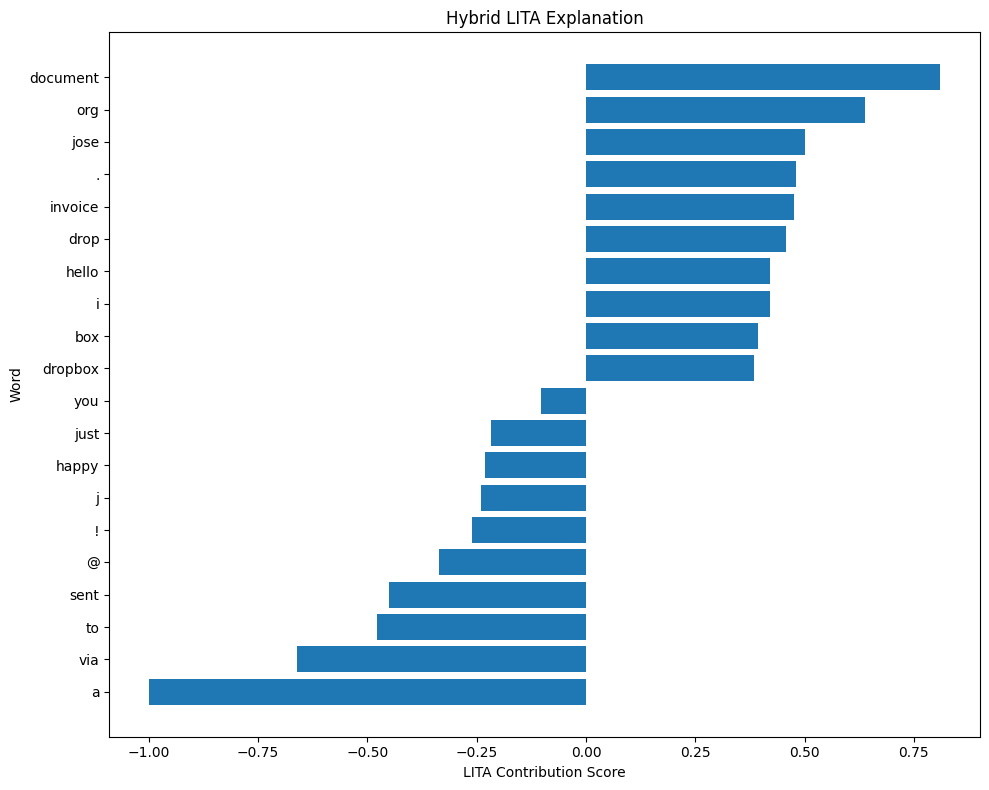

In [112]:
import matplotlib.pyplot as plt

top_positive = lita_results_df.head(10)

top_negative = (
    lita_results_df
    .tail(10)
    .sort_values("LITA Score")
)

plot_df = pd.concat([
    top_negative,
    top_positive
]).sort_values("LITA Score")

plt.figure(figsize=(10, 8))

plt.barh(
    plot_df["Word"],
    plot_df["LITA Score"]
)

plt.xlabel("LITA Contribution Score")
plt.ylabel("Word")
plt.title("Hybrid LITA Explanation")

plt.tight_layout()
plt.show()

In [113]:
lita_results_df.to_csv(
    "paper2_lita_explanation.csv",
    index=False
)

In [114]:
comparison_df = lita_results_df[
    [
        "Word",
        "Normalised LIME Score",
        "Normalised Transformer Score",
        "LITA Score"
    ]
].head(20)

comparison_df

,Word,Normalised LIME Score,Normalised Transformer Score,LITA Score
0,document,0.621172,1.000000,0.810586
1,org,0.917734,0.359506,0.638620
2,jose,1.000000,0.000000,0.500000
3,.,0.000000,0.961755,0.480877
4,invoice,0.581234,0.371752,0.476493
5,drop,0.000000,0.915253,0.457626
6,hello,0.510845,0.331133,0.420989
7,i,0.000000,0.841493,0.420746
8,box,0.000000,0.784760,0.392380
9,dropbox,0.767516,0.000000,0.383758
